# ModClasClientes - Clasificación de usuarios

## Notebook para probar diferentes configuraciones y obtener el modelo.
Este código lee los datos históricos de la clasificación de un conjunto de usuarios y los datos utilizados para realizar esta clasificación.

# 0. Configuración

Instalar pycaret si fuese necesario

In [1]:
pip install pycaret

/opt/conda/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
  Using cached pycaret-2.3.1-py3-none-any.whl (261 kB)
  Using cached scikit_learn-0.23.2-cp37-cp37m-manylinux1_x86_64.whl (6.8 MB)
  Using cached pyLDAvis-3.3.1-py2.py3-none-any.whl
  Using cached pyod-0.8.8-py3-none-any.whl
  Using cached yellowbrick-1.3.post1-py3-none-any.whl (271 kB)
  Using cached wordcloud-1.8.1-cp37-cp37m-manylinux1_x86_64.whl (366 kB)
  Using cached spacy-2.3.5-cp37-cp37m-manylinux2014_x86_64.whl (10.4 MB)
  Using cached mlflow-1.17.0-py3-none-any.whl (14.2 MB)
  Using cached mlxtend-0.18.0-py2.py3-none-any.whl (1.3 MB)
  Using cached umap_learn-0.5.1-py3-none-

In [1]:
import pandas as pd
from pycaret.classification import *
import datetime
import os
from boto3 import client
S3=client('s3')

# 1. Carga de datos

In [2]:
dataset_raw = pd.read_csv('../datasets/dataset_ModClasClientes.csv')
dataset_raw.head()

,userid,has_darwin,pfees,darwinia,dscore,commissions,investment,old_darwin,label
0,4acac908-516a-40f3-8d9e-a1a54b59d937,True,329.131762,513.338761,811.833174,6.100919,56.571613,True,2
1,53896cf7-e0ff-4c99-b71b-2640f2bdeb5c,True,329.131762,513.338761,626.675995,6.100919,0.000000,True,3
2,e079ea73-c4c6-4492-9fcf-39e877bd6cc8,True,0.000000,0.000000,0.000000,0.284045,0.000000,True,3
3,7c344536-ee4b-42dc-9731-d344078d0f54,True,0.022516,0.000000,0.000000,2.369245,0.000000,True,3
4,2be80745-12a6-4865-b27a-86f65c03e51a,False,0.000000,0.000000,0.000000,0.113741,0.000000,False,5


# 2. Iniciar PyCaret

A la hora de inicializar PyCaret solo hemos configurado la columna que es el objetivo (label_num) y las columnas a ignorar, el resto de parámetros están por defecto.

In [54]:
clf1 = setup(dataset_raw, normalize=False, target = 'label', ignore_features=['userid'], silent=True)

,Description,Value
0,session_id,4261
1,Target,label
2,Target Type,Multiclass
3,Label Encoded,"0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5"
4,Original Data,"(18000, 9)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


# 3. Crear el modelo y elegir la mejor opción

In [55]:
top = compare_models(n_select=1)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.9999,1.0000,0.9999,0.9999,0.9999,0.9999,0.9999,0.0140
rf,Random Forest Classifier,0.9998,1.0000,0.9998,0.9998,0.9998,0.9998,0.9998,0.3580
gbc,Gradient Boosting Classifier,0.9998,1.0000,0.9998,0.9998,0.9998,0.9998,0.9998,3.0170
lightgbm,Light Gradient Boosting Machine,0.9989,1.0000,0.9989,0.9989,0.9989,0.9987,0.9987,0.5790
et,Extra Trees Classifier,0.9977,1.0000,0.9977,0.9977,0.9977,0.9972,0.9972,0.3080
knn,K Neighbors Classifier,0.9598,0.9938,0.9599,0.9608,0.9598,0.9517,0.9519,0.0870
lr,Logistic Regression,0.8608,0.9801,0.8605,0.8633,0.8587,0.8329,0.8345,3.0290
nb,Naive Bayes,0.7677,0.9628,0.7672,0.7640,0.7561,0.7211,0.7251,0.0150
svm,SVM - Linear Kernel,0.7001,0.0000,0.7004,0.7678,0.6987,0.6401,0.6588,0.2180
lda,Linear Discriminant Analysis,0.6660,0.9182,0.6669,0.7228,0.6037,0.5993,0.6207,0.0260


# 4. Ajustar hiperparámetros

In [56]:
top_tuned = tune_model(top)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.9992,0.9995,0.9992,0.9992,0.9992,0.9990,0.9990


## 4.1 Calibramos el modelo para mostrar la probabilidad

In [57]:
calibrated_dt = calibrate_model(top_tuned)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.9992,1.0000,0.9992,0.9992,0.9992,0.9990,0.9990


# 5. Probar modelo con datos de test

In [58]:
predict_new = predict_model(calibrated_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


In [59]:
predict_new

,pfees,darwinia,dscore,commissions,investment,has_darwin_False,old_darwin_False,label,Label,Score
0,61.827423,102.633186,934.813599,0.492076,19.842134,0.0,0.0,2,2,0.9951
1,24.176350,66.572876,577.065552,0.306708,32.819790,0.0,0.0,0,0,0.9952
2,0.267156,33.233116,749.546753,2.948108,0.000000,0.0,0.0,2,2,0.9951
3,0.029339,8.282865,806.639221,2.094820,0.860515,0.0,0.0,2,2,0.9951
4,0.000000,5.547740,529.280823,1.170655,0.000000,0.0,0.0,3,3,0.9952
...,...,...,...,...,...,...,...,...,...,...
5396,0.000000,0.000000,0.000000,45.875717,0.000000,1.0,1.0,1,1,0.9952
5397,0.000000,0.000000,0.000000,4.953274,0.000000,0.0,1.0,4,4,0.9951
5398,0.000000,0.000000,0.000000,0.980016,0.000000,1.0,1.0,5,5,0.9952
5399,24.176350,66.572876,577.065552,1.465146,30.801056,0.0,0.0,0,0,0.9952


 # 6. Mostrar información del modelo
 ## 6.1 Area Under the Curve

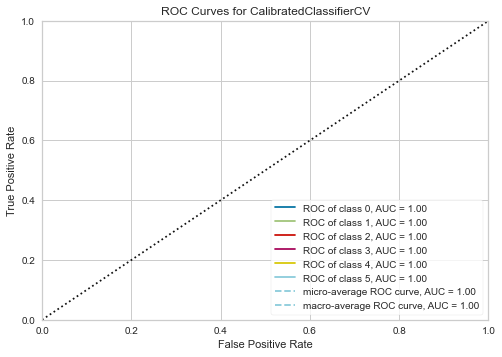

In [60]:
try:
    plot_model(calibrated_dt, plot='auc')
except Exception as ex:
    print("This model can't measure auc.")

## 6.2 Precision Recall Curve

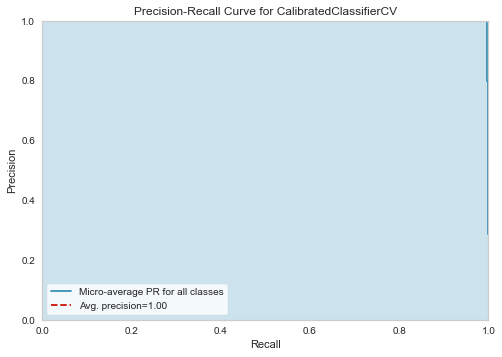

In [61]:
plot_model(calibrated_dt, plot='pr')

## 6.3 Confusion Matrix

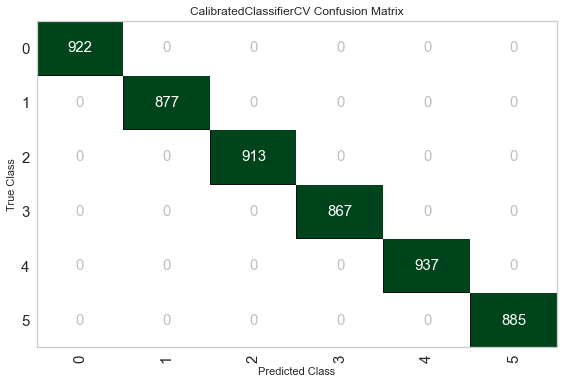

In [62]:
plot_model(calibrated_dt, plot='confusion_matrix')

## 6.4 Class Prediction Error

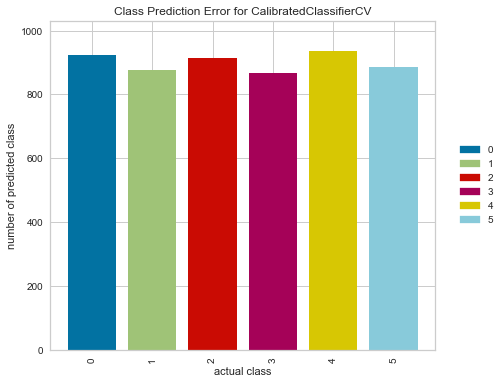

In [63]:
plot_model(calibrated_dt, plot='error')

## 6.5 Classification Report

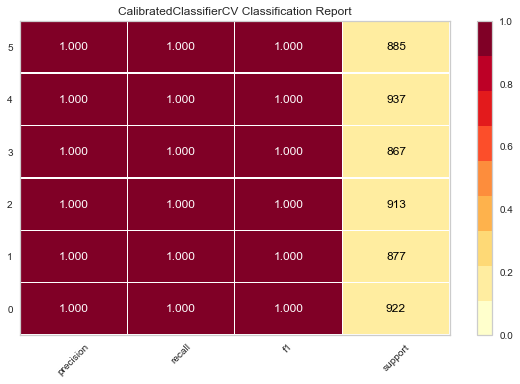

In [64]:
plot_model(calibrated_dt, plot='class_report')

## 6.6 Learning Curve

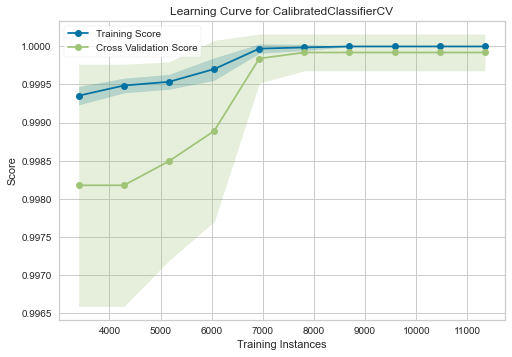

In [65]:
plot_model(calibrated_dt, plot='learning')

## 6.8 Feature Importance

El modelo calibrado no permite representar esta grafica, por lo que utilizamos el modelo justo antes de calibrarlo.

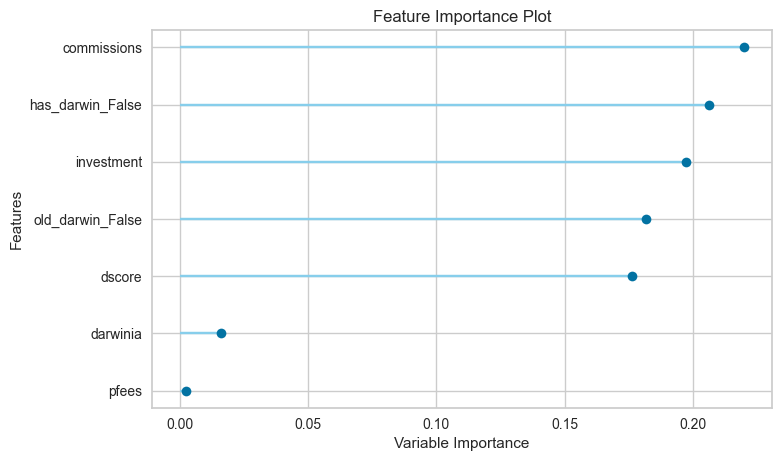

In [66]:
plot_model(top_tuned, plot='feature')

## 6.9 Decision Trees

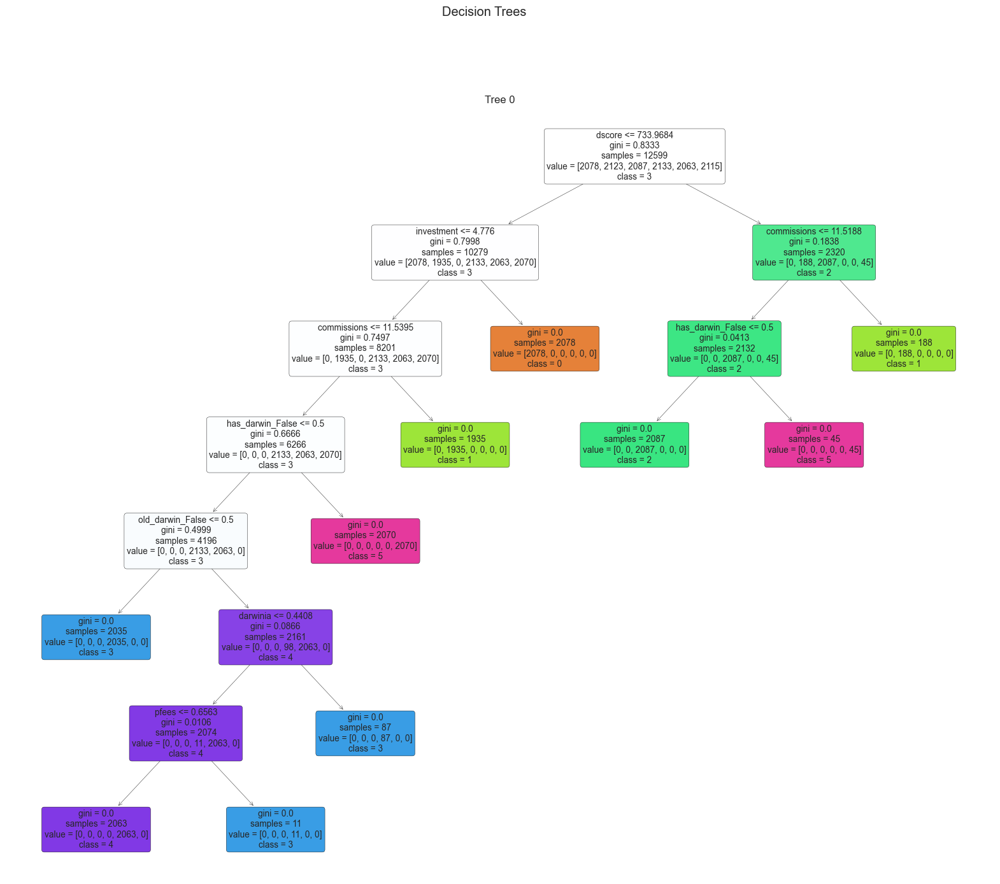

In [67]:
plot_model(top_tuned, plot='tree')

 # 7. Finalizar y guardar modelo

In [68]:
final_model = finalize_model(calibrated_dt)
#save_model(final_model, model_name='ModClasClientes', verbose=False)
#S3.upload_file('ModClasClientes.pkl', 'tfm-2021-darwinex', 'models/ModClasClientes/final_model.pkl')
#S3.upload_file('ModClasClientes.pkl', 'tfm-2021-darwinex', 'models/ModClasClientes/history/{}_model'.format(datetime.datetime.now()))